Basic code for image captioning using encoder-decoder (No Attention Mechanism Used) architecture. Can be made more computationally efficient by masking padded tokens. Other possibilities include: Better Initialization, Image Augmentation, Better Architecture for encoder and decoder, Better Training, More Epochs. The dataset used is Flickr-8K. It has got 8091 images. Five captions for each image. Resnet50 is used for feature extraction.

Steps:
1. Import
2. Check for the device
3. Define a function for Normalizing the string
4. Prepare list of 1. image file paths, and 2. Normalize captions
5. Write Vocan class and build the vocab
6. Prepare Custom Dataset and DataLoader
7. Write Encoder and Decoder
8. Write train and eval loop.

In [1]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import Dataset, DataLoader, random_split
from PIL import Image
from torchvision.transforms import Resize, ToTensor, Normalize, Compose
from matplotlib import pyplot as plt

from torchvision.models import resnet50,ResNet50_Weights 

from io import open
import unicodedata
import re

In [2]:
if torch.cuda.is_available():
    device=torch.device(type='cuda', index=0)
else:
    device=torch.device(type='cpu', index=0)

In [3]:
#unicode 2 ascii, remove non-letter characters, trim
def normalizeString(s): 
    sres=""
    for ch in unicodedata.normalize('NFD', s): 
        #Return the normal form form ('NFD') for the Unicode string s.
        if unicodedata.category(ch) != 'Mn':
            # The function in the first part returns the general 
            # category assigned to the character ch as string. 
            # "Mn' refers to Mark, Nonspacing
            sres+=ch
    #sres = re.sub(r"([.!?])", r" \1", sres) 
    # inserts a space before any occurrence of ".", "!", or "?" in the string sres. 
    sres = re.sub(r"[^a-zA-Z!?,]+", r" ", sres) 
    # this line of code replaces any sequence of characters in sres 
    # that are not letters (a-z or A-Z) or the punctuation marks 
    # "!", "," or "?" with a single space character.
    return sres.strip()

In [4]:
#driver code part 1

capt_file_path="/kaggle/input/flickr8k/captions.txt"
images_dir_path="/kaggle/input/flickr8k/Images/"

#read data
data=open(capt_file_path).read().strip().split('\n')
data=data[1:]

img_filenames_list=[]
captions_list=[]

for s in data:
    templist=s.lower().split(",")
    img_path=templist[0]
    caption=",".join(s for s in templist[1:])
    caption=normalizeString(caption)
    img_filenames_list.append(img_path)
    captions_list.append(caption)

In [5]:
max_cap_length=73

In [6]:
class Vocab:
    def __init__(self):
        self.word2index={'SOS':0, 'EOS':1}
        self.index2word={0:'SOS', 1:'EOS'}
        self.word2count={}
        self.nwords=2
    
    def buildVocab(self,s):
        for word in s.split(" "):
            if word not in self.word2index:
                self.word2index[word]=self.nwords
                self.index2word[self.nwords]=word
                self.word2count[word]=1
                self.nwords+=1
            else:
                self.word2count[word]+=1

In [7]:
#driver code part 2

#create Vocab objects for each language
vocab=Vocab()

#build the vocab
for caption in captions_list:
    vocab.buildVocab(caption)

#print vocab size
print("Vocab Length:",vocab.nwords)

Vocab Length: 8446


In [8]:
class CustomDataset(Dataset):
    def __init__(self,images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length):
        super().__init__()
        self.images_dir_path=images_dir_path
        self.img_filenames_list=img_filenames_list
        self.captions_list=captions_list
        self.length=len(self.captions_list)
        self.transform=Compose([Resize((224,224), antialias=True), ToTensor(), Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
        self.vocab=vocab
        self.max_cap_length=max_cap_length
    
    def __len__(self):
        return self.length
    
    def get_input_ids(self, sentence,vocab):
        input_ids=[0]*(self.max_cap_length+1)
        i=0
        for word in sentence.split(" "):
            input_ids[i]=vocab.word2index[word]
            i=i+1

        input_ids.insert(0,vocab.word2index['SOS'])
        i=i+1
        input_ids[i]=vocab.word2index['EOS']
    
        return torch.tensor(input_ids)
    
    def __getitem__(self,idx):
        imgfname,caption=self.img_filenames_list[idx],self.captions_list[idx]
        
        imgfname=self.images_dir_path+imgfname
        img=Image.open(imgfname)
        img=self.transform(img)
        
        caption=self.get_input_ids(caption,self.vocab)       
        
        return img,caption

In [9]:
#driver code part 3
dataset=CustomDataset(images_dir_path, img_filenames_list, captions_list, vocab, max_cap_length)
train_dataset,test_dataset=random_split(dataset,[0.999,0.001])

batch_size=64
train_dataloader=DataLoader(dataset=train_dataset,batch_size=batch_size, shuffle=True)
test_dataloader=DataLoader(dataset=test_dataset,batch_size=1, shuffle=False)

In [10]:
class Encoder(nn.Module):
    def __init__(self, pretrained_feature_extractor):
        super().__init__()
        self.pretrained_feature_extractor=pretrained_feature_extractor
        
    def forward(self,x):
        features=self.pretrained_feature_extractor(x)
        return features

In [11]:
#driver code part 4
pretrained_feature_extractor=resnet50(weights=ResNet50_Weights.DEFAULT)
pretrained_feature_extractor.fc=nn.Linear(2048,1024)

encoder=Encoder(pretrained_feature_extractor).to(device)

In [12]:
class Decoder(nn.Module):
    def __init__(self,output_size,embed_size,hidden_size):
        super().__init__()
        self.e=nn.Embedding(output_size,embed_size)
        self.relu=nn.ReLU()
        self.gru=nn.GRU(embed_size, hidden_size, batch_first=True)
        self.lin=nn.Linear(hidden_size,output_size)
        self.lsoftmax=nn.LogSoftmax(dim=-1)
    
    def forward(self,x,prev_hidden):
        x=self.e(x)
        x=self.relu(x)
        output,hidden=self.gru(x,prev_hidden)
        y=self.lin(output)
        y=self.lsoftmax(y)
        return y, hidden

In [13]:
#driver code part 5
embed_size=300
hidden_size=1024

decoder=Decoder(vocab.nwords,embed_size,hidden_size).to(device)

In [14]:
def train_one_epoch():
    encoder.train()
    decoder.train()
    track_loss=0
    
    for i, (imgs,t_ids) in enumerate(train_dataloader):
        imgs=imgs.to(device)
        t_ids=t_ids.to(device)
        extracted_features=encoder(imgs)
        #extracted_features=extracted_features.detach()
        decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1))
        yhats, decoder_hidden = decoder(t_ids[:,0:-1],decoder_hidden)
                    
        gt=t_ids[:,1:]
        
        yhats_reshaped=yhats.view(-1,yhats.shape[-1])
        
        gt=gt.reshape(-1)
        
        
        loss=loss_fn(yhats_reshaped,gt)
        track_loss+=loss.item()
        
        opte.zero_grad()
        optd.zero_grad()
        
        loss.backward()
        
        opte.step()
        optd.step()
        
        if i%50==0:
            print("Mini Batch=", i+1," Running Loss=",track_loss/(i+1), sep="")
        
    return track_loss/len(train_dataloader)    

In [15]:
def ids2Sentence(ids,vocab):
    sentence=""
    for id in ids.squeeze():
        if id==0:
            continue
        word=vocab.index2word[id.item()]
        sentence+=word + " "
        if id==1:
            break
    return sentence

In [16]:
#eval loop (written assuming batch_size=1)
def eval_one_epoch():
    encoder.eval()
    decoder.eval()
    track_loss=0
    
    with torch.no_grad():
        
        for i, (imgs,t_ids) in enumerate(test_dataloader):
            
            imgs=imgs.to(device)
            t_ids=t_ids.to(device)
            
            extracted_features=encoder(imgs)
            
            decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1)) #n_dim=3
            
            input_ids=t_ids[:,0]
            yhats=[]
            pred_sentence=""
            
            for j in range(1,max_cap_length+2): #j starts from 1
                probs, decoder_hidden = decoder(input_ids.unsqueeze(1),decoder_hidden)
                yhats.append(probs)
                _,input_ids=torch.topk(probs,1,dim=-1)
                input_ids=input_ids.squeeze(1,2) #still a tensor
                word=vocab.index2word[input_ids.item()] #batch_size=1
                pred_sentence+=word + " "
                if input_ids.item() == 1: #batch_size=1
                    break
                                
            
            gt_sentence=ids2Sentence(t_ids,vocab)
            
            print("Input Image:")
            img=imgs[0]
            img[0]=(img[0]*0.229)+0.485
            img[1]=(img[1]*0.224)+0.456
            img[2]=(img[2]*0.225)+0.406
            plt.imshow(torch.permute(imgs[0],(1,2,0)).detach().cpu())
            plt.show()
            
            print("GT Sentence:",gt_sentence)
            
            print("Predicted Sentence:",pred_sentence)
            
            yhats_cat=torch.cat(yhats,dim=1)
            yhats_reshaped=yhats_cat.view(-1,yhats_cat.shape[-1])
            gt=t_ids[:,1:j+1]
            gt=gt.view(-1)
            

            loss=loss_fn(yhats_reshaped,gt)
            track_loss+=loss.item()
            
            
        print("-----------------------------------")
        return track_loss/len(test_dataloader)    

Mini Batch=1 Running Loss=9.057417869567871
Mini Batch=51 Running Loss=5.2486366103677184
Mini Batch=101 Running Loss=4.741895718149619
Mini Batch=151 Running Loss=4.436148935595885
Mini Batch=201 Running Loss=4.241693429092862
Mini Batch=251 Running Loss=4.099607463851868
Mini Batch=301 Running Loss=3.9789706789377917
Mini Batch=351 Running Loss=3.882013881987656
Mini Batch=401 Running Loss=3.7973702019289544
Mini Batch=451 Running Loss=3.7251122129994325
Mini Batch=501 Running Loss=3.664543470222793
Mini Batch=551 Running Loss=3.6080238624406595
Mini Batch=601 Running Loss=3.559754568407817
Epoch=1 Loss=3.5329
Mini Batch=1 Running Loss=2.6104211807250977
Mini Batch=51 Running Loss=2.6742364518782673
Mini Batch=101 Running Loss=2.6826518903864494
Mini Batch=151 Running Loss=2.686298664042492
Mini Batch=201 Running Loss=2.6858119596889365
Mini Batch=251 Running Loss=2.6828404688740157
Mini Batch=301 Running Loss=2.6798061461147675
Mini Batch=351 Running Loss=2.6710855702728966
Mini Bat

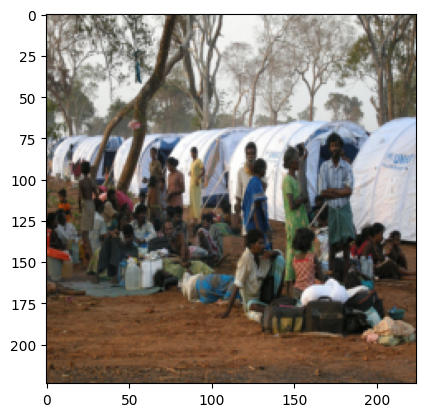

GT Sentence: some people sit , and some stand in a group of families before a background of white tents with un markings EOS 
Predicted Sentence: people are gathered around a white pillared full of tents EOS 
Input Image:


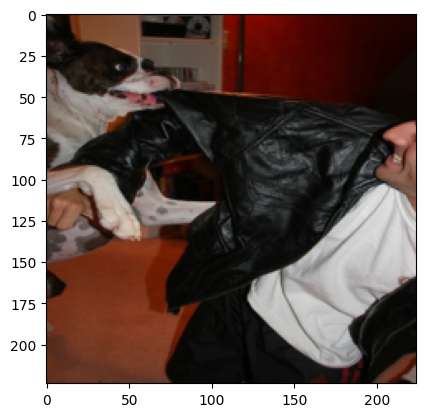

GT Sentence: a black and white dog bits the jacket of a person EOS 
Predicted Sentence: the dog is wearing a red and white coat EOS 
Input Image:


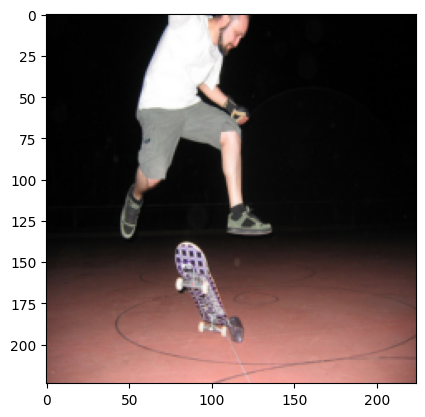

GT Sentence: a man jumps in the air while performing a stunt on his skateboard EOS 
Predicted Sentence: a man in a white shirt and black pants skateboarding EOS 
Input Image:


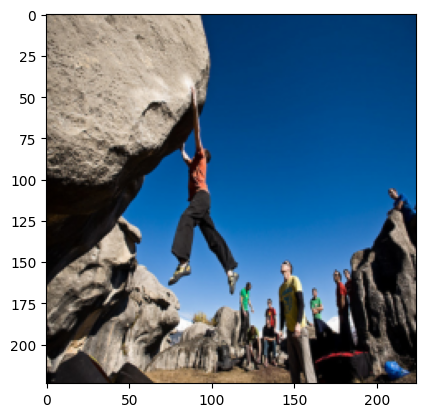

GT Sentence: a person hangs off a large rock as other people watch EOS 
Predicted Sentence: a man is scaling a large cliff EOS 
Input Image:


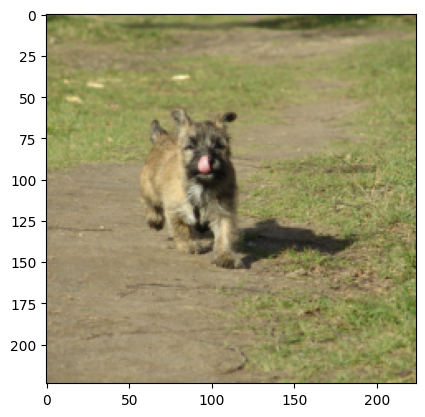

GT Sentence: small brown dog licks lips as it runs across grass and dirt EOS 
Predicted Sentence: a dog is running through a field EOS 
Input Image:


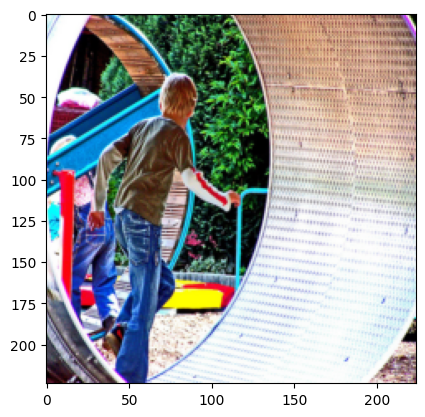

GT Sentence: a boy is running in a spinning metal tunnel in the playground EOS 
Predicted Sentence: a boy is playing in a large metal barrel EOS 
Input Image:


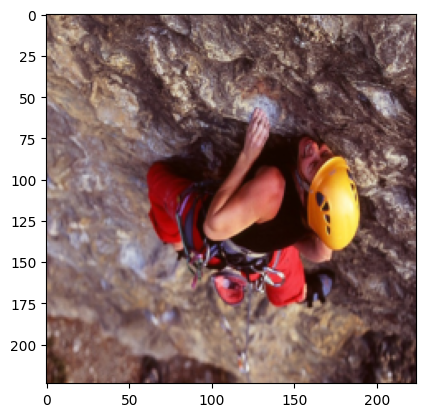

GT Sentence: a climber in a yellow hard hat is seen mid climb from above EOS 
Predicted Sentence: a person wearing a yellow helmet is climbing a rock EOS 
Input Image:


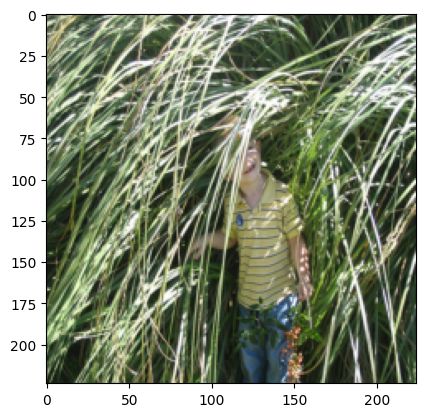

GT Sentence: the little boy in a yellow , striped shirt stands in some tall grass EOS 
Predicted Sentence: a child in a blue shirt and khaki shorts is standing in the hay EOS 
Input Image:


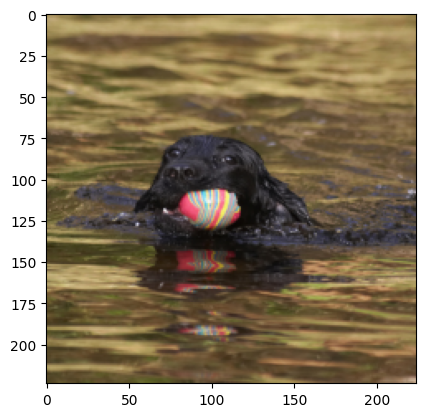

GT Sentence: a black dog is swimming with a ball in his mouth EOS 
Predicted Sentence: a black dog swims in water with a colorful ball EOS 
Input Image:


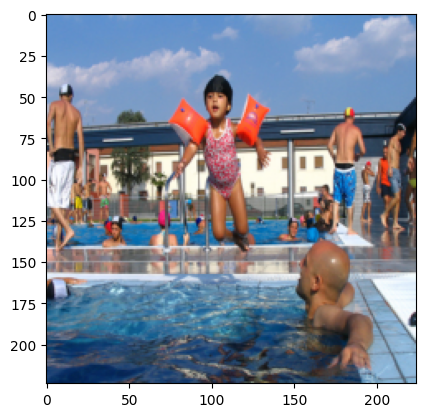

GT Sentence: a little girl with inflatable armbands is jumping into the pool EOS 
Predicted Sentence: a little girl is jumping into a pool while another watches EOS 
Input Image:


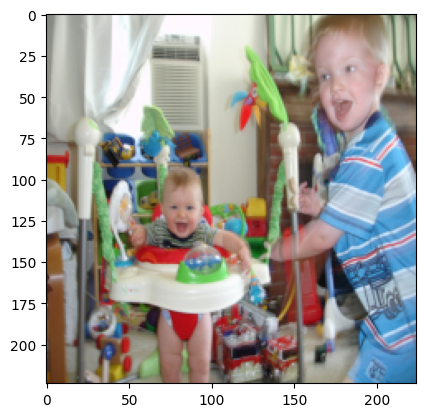

GT Sentence: a baby and a toddler are smiling whilst playing in a nursery EOS 
Predicted Sentence: a baby boy surrounded by toys and a baby EOS 
Input Image:


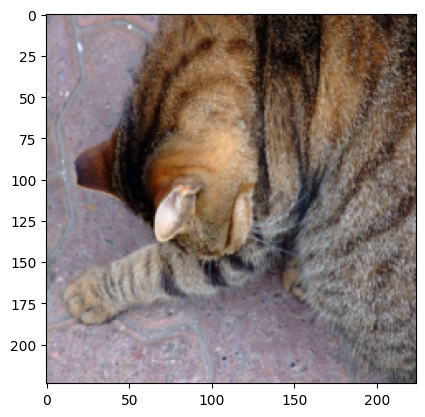

GT Sentence: a striped cat is on the pathway EOS 
Predicted Sentence: a cat licks itself EOS 
Input Image:


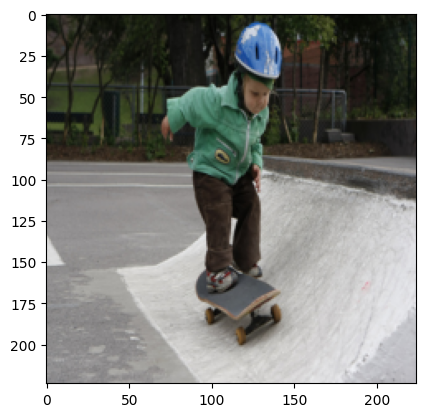

GT Sentence: a little boy skateboards on a cement ramp EOS 
Predicted Sentence: a little boy in a green shirt is skateboarding on a ramp EOS 
Input Image:


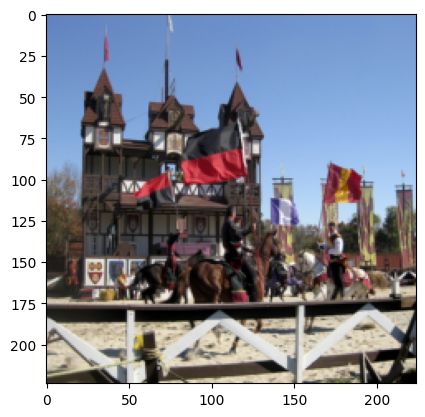

GT Sentence: men ride on horses while carrying flags EOS 
Predicted Sentence: men on horses displaying their flags in the air EOS 
Input Image:


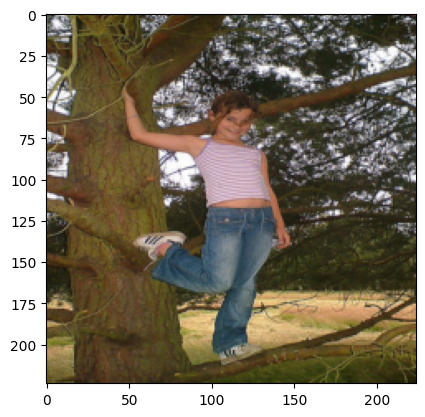

GT Sentence: the young girl is standing in a tree EOS 
Predicted Sentence: a little girl in jeans and a t shirt is posing for a tree EOS 
Input Image:


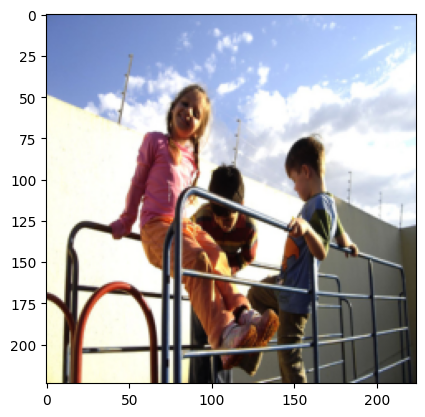

GT Sentence: the three children are playing on the rails EOS 
Predicted Sentence: three children play on a gaurd rail EOS 
Input Image:


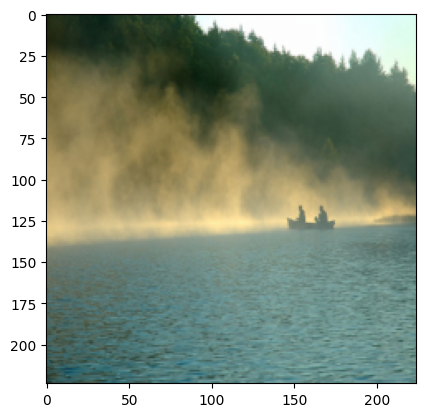

GT Sentence: a silhouette of two men in a boat on a misty lake EOS 
Predicted Sentence: a person paddles a boat on a lake EOS 
Input Image:


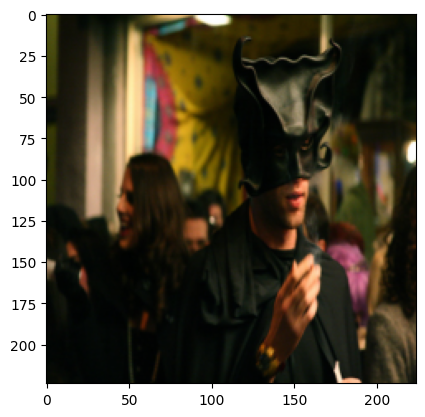

GT Sentence: man dressed in black wearing elaborate black mask EOS 
Predicted Sentence: a man in a black shirt is standing in a crowd of people EOS 
Input Image:


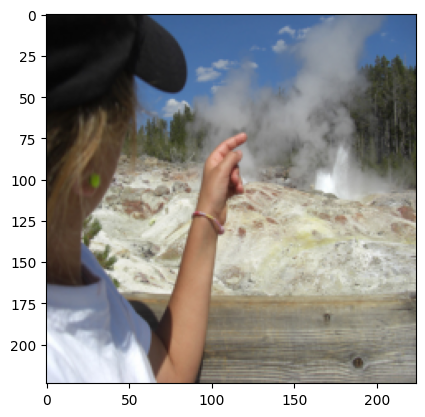

GT Sentence: women pointing at a geyser EOS 
Predicted Sentence: a person in a white tank top and shorts is standing in the sand EOS 
Input Image:


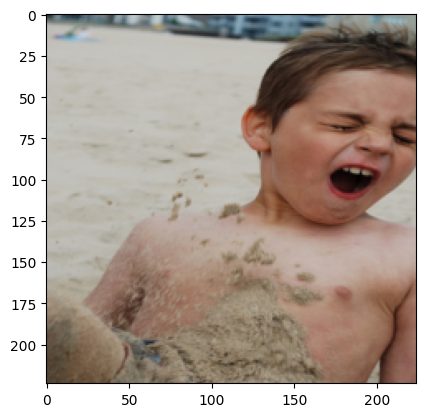

GT Sentence: the boy is playing in the sand EOS 
Predicted Sentence: a young boy falls off his sand into the sand EOS 
Input Image:


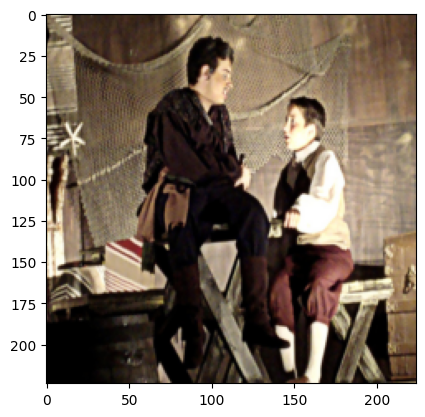

GT Sentence: two males in period costume are having a conversation EOS 
Predicted Sentence: the man sang the boy in the work as the man is speaking EOS 
Input Image:


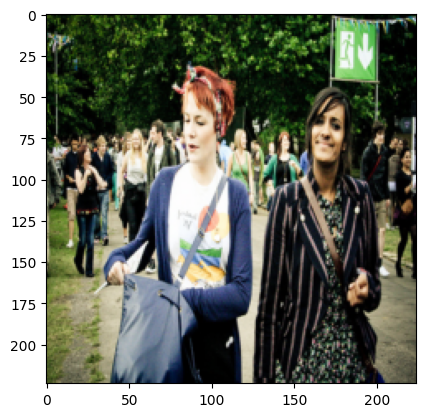

GT Sentence: there are two girls in the foreground of a group of people and they are both carrying shoulder book bags EOS 
Predicted Sentence: a man and woman walk past a large crowd of people EOS 
Input Image:


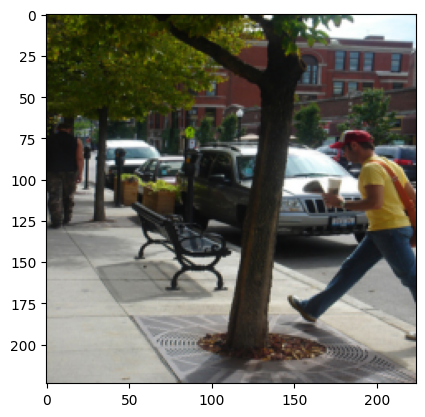

GT Sentence: a man in a yellow shirt walks past a tree on the sidewalk EOS 
Predicted Sentence: a man in a yellow shirt is walking past a line of pedestrians EOS 
Input Image:


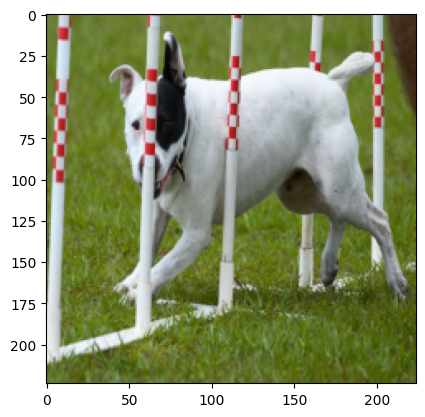

GT Sentence: a black and white dog running through some red and white poles EOS 
Predicted Sentence: a white and white dog rushes through an agility competition EOS 
Input Image:


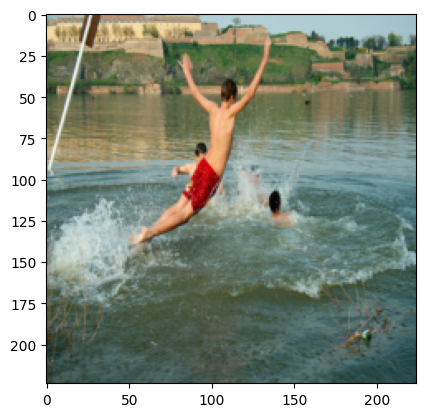

GT Sentence: a boy in a red swimsuit jumps into the water to join two people EOS 
Predicted Sentence: a boy in a red shirt is jumping into the water EOS 
Input Image:


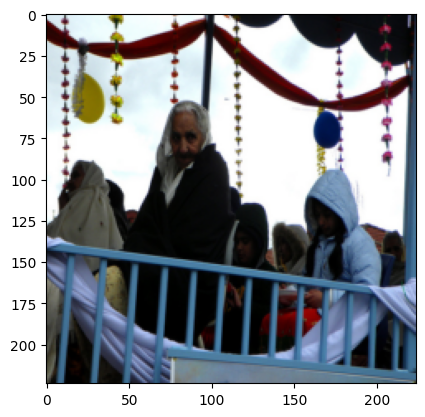

GT Sentence: a shawled woman sits with others EOS 
Predicted Sentence: a woman wearing a headscarf looks to the right of the seated EOS 
Input Image:


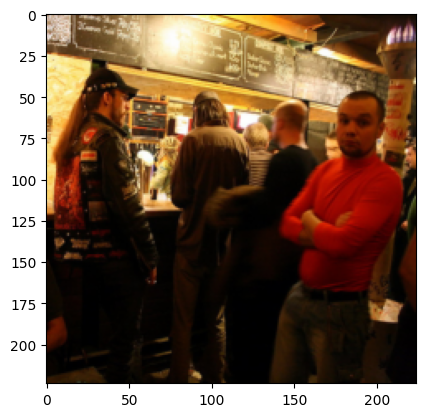

GT Sentence: this man is the red shirt is waiting at a restaurant EOS 
Predicted Sentence: a group of people stand around a table at night EOS 
Input Image:


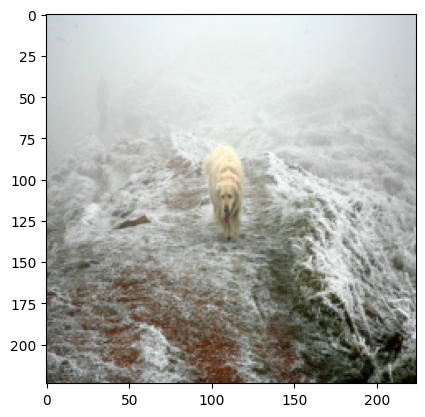

GT Sentence: a dog walks in a foggy place EOS 
Predicted Sentence: a dog walking through snow EOS 
Input Image:


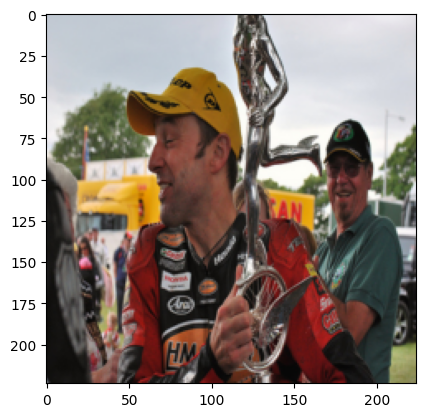

GT Sentence: a race car driver is holding a trophy EOS 
Predicted Sentence: a man in a yellow hardhat is holding a cup EOS 
Input Image:


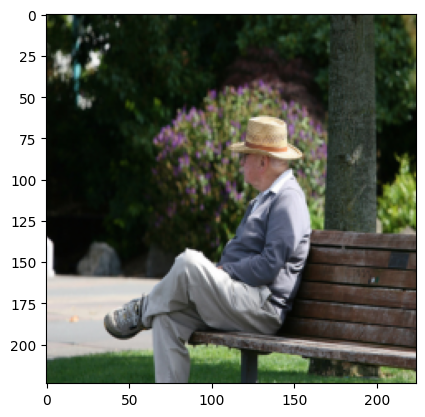

GT Sentence: white haired man in gray sweater and a straw hat sitting on a bench under a tree EOS 
Predicted Sentence: the old man in the white hat is sitting on a bench EOS 
Input Image:


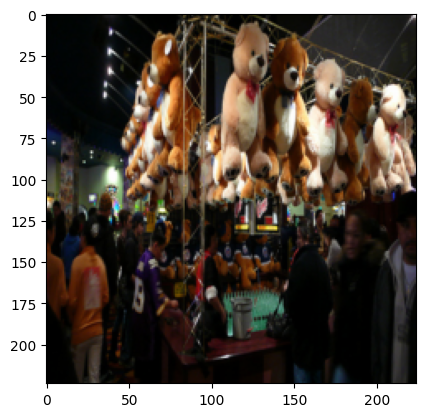

GT Sentence: a crowd of people are at a fair in front of booth where giant teddy bears can be won EOS 
Predicted Sentence: a stuffed bears is surrounded by stuffed animals bears in a crowd EOS 
Input Image:


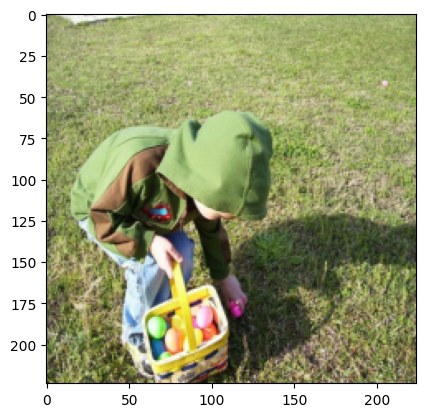

GT Sentence: a young boy carrying a basket collects easter eggs in the grass EOS 
Predicted Sentence: a child in a green shirt is collecting colored eggs , with a basket of colored eggs and a hat EOS 
Input Image:


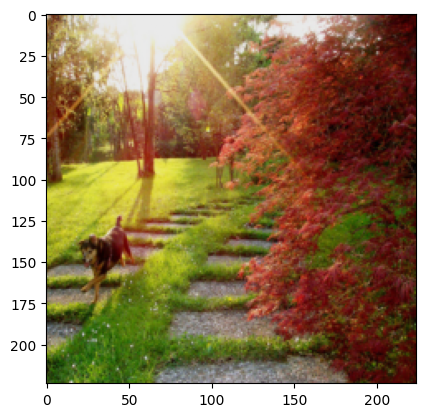

GT Sentence: a black and tan dog is running along a series of stone walkways spaced between grass EOS 
Predicted Sentence: a dog runs down a paved path EOS 
Input Image:


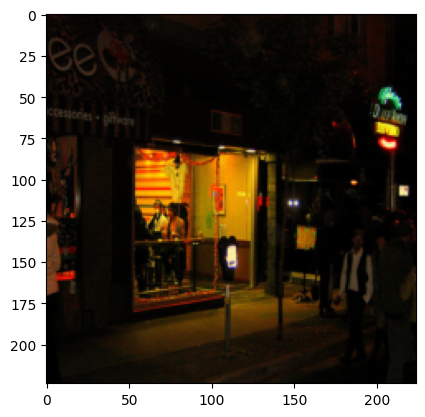

GT Sentence: some people in building as seen from the street at night EOS 
Predicted Sentence: a man walks by a group of people dining a dining light EOS 
Input Image:


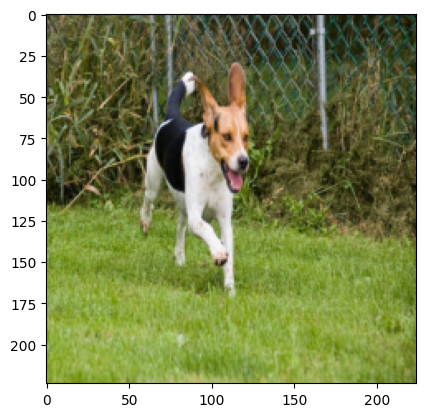

GT Sentence: a dog runs through a lush , green lawn EOS 
Predicted Sentence: a white and brown dog is running through the grass EOS 
Input Image:


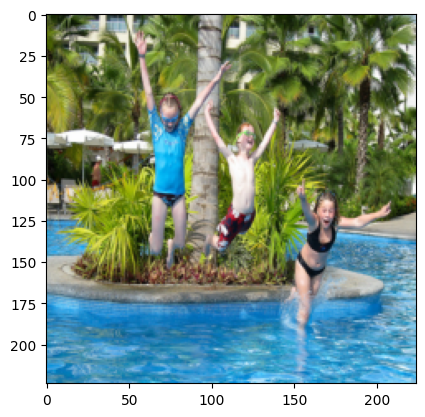

GT Sentence: three children jumping into a pool EOS 
Predicted Sentence: three children jumping into a pool EOS 
Input Image:


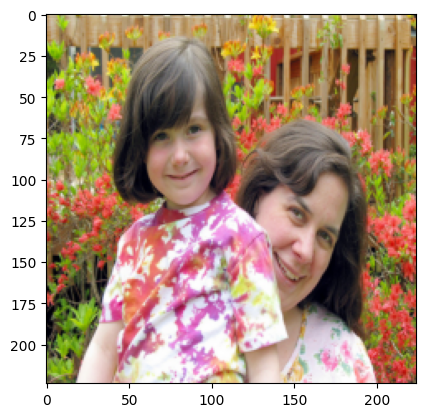

GT Sentence: a woman and a young girl pose and smile for a photo EOS 
Predicted Sentence: a woman poses for a picture in front of a flower bush EOS 
Input Image:


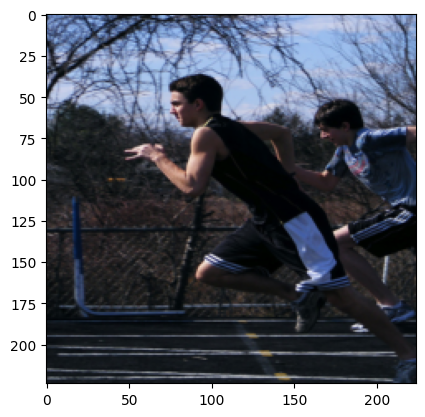

GT Sentence: two young men running along a track EOS 
Predicted Sentence: two boys run on a track EOS 
Input Image:


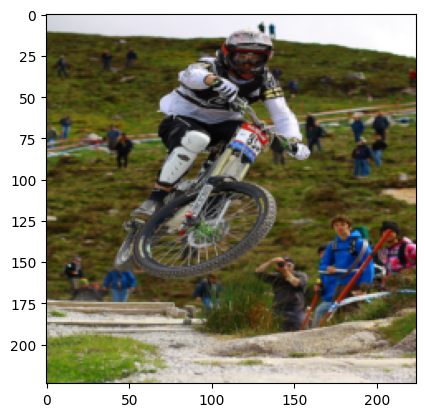

GT Sentence: a mountain bike racer jumps his bike as spectators watch EOS 
Predicted Sentence: a motorcyclist is performing a trick in midair EOS 
Input Image:


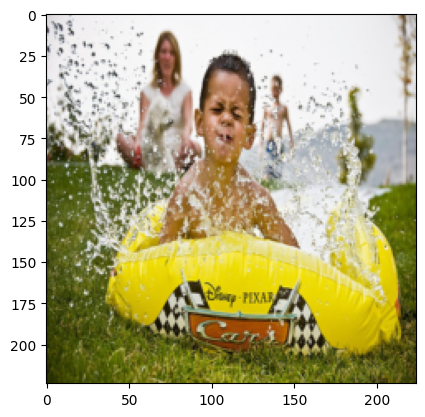

GT Sentence: a young boy slides down a yellow water slide EOS 
Predicted Sentence: a little girl is running through a yellow inflatable toy EOS 
-----------------------------------
Epoch=1 Loss=6.9151


In [17]:
#driver code part 5

loss_fn=nn.NLLLoss(ignore_index=0).to(device)
lr=0.001

optd=optim.Adam(params=decoder.parameters(), lr=lr)
opte=optim.Adam(params=encoder.parameters(), lr=lr)

n_epochs=5

for e in range(n_epochs):
    print("Epoch=",e+1, " Loss=", round(train_one_epoch(),4), sep="")

for e in range(1):
    print("Epoch=",e+1, " Loss=", round(eval_one_epoch(),4), sep="")